# **Drifting assemblies in networks of linear Poisson neurons**
Yaroslav Felipe Kalle Kossio, Sven Goedeke, Christian Klos, and Raoul-Martin Memmesheimer

*Neural Network Dynamics and Computation, Institute of Genetics, University of Bonn, Germany.*

---

This notebook contains the implementation and parameters of the Poisson network model demonstrating drifting assemblies without spontaneous assembly reactivations (see corresponding section and Fig. 8 in the manuscript as well as SI Appendix Figs. S13 and S14). The simulation of the spiking dynamics is event-based. With a recent desktop processor (e.g. i5) a simulation of 1800 hours = 75 days network time should take about 24 hours. After this simulation time the assembly structure is completely reshuffled with respect to the initial structure. Reordering the weight matrices with the help of a community detection algorithm (Louvain algorithm from the brain connectivity toolbox bctpy) reveals that the assembly structure persists. For further analysis weight and connectivity matrices are stored during the simulation and can be saved to a file.

To illustrate assembly drift the simulation time is set to 100 hours during which first switching of neurons between the assemblies can be observed (see plots of the weight matrices during the simulation).

# Import dependencies

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from numpy.random import default_rng
from tqdm import tqdm

# Parameters and helper functions

In [2]:
# Seed for random number generation
seed = 1112
rng = default_rng(seed)

## Network and neuron parameters

In [3]:
tau = 0.01 # decay time constant in seconds, sets the time scale of the dynamics
# actual simulation is performed in units of tau
s_in_tau = 1/tau # seconds in units of tau
h_in_tau = 3600 * s_in_tau # hours in units of tau

N = 105 # number of neurons
p_cc = 0.65 # average fraction of existing synapses (connection probability)

W_max = 0.25 # total (dimensionless) summed synaptic input/output weight (network branching parameter)
nc = 3 # number of assemblies for initial partition of the network 
w_max = W_max/((N/nc-4)*p_cc) # upper bound of single synaptic weight

f_theo = 1.0 * tau # average target rate (per neuron) in Hz
f0_theo = (1-W_max)*f_theo # required spontaneous rate for given W_max
f1_theo = W_max * f_theo # corresponding evoked rate
# auxiliary parameters for simulation:
f0 = f0_theo * np.ones(N) # individual neurons' spontaneous rates
f0sum = f0.sum()
f0prob = f0/f0sum
scale_f0sum = 1/f0sum

print("w_max:", w_max, ", W_max:", W_max)
print("Initial assembly size:", int(N/nc))
print("Expected saturated assembly size:", W_max/w_max/p_cc+1)
print("Single neuron spontaneous rate f0:", f0_theo * s_in_tau, "Hz")
print("Single neuron average evoked rate <f1>:", f1_theo * s_in_tau, "Hz")
print("Expected total number of spikes per second:", N * f_theo * s_in_tau)

w_max: 0.012406947890818858 , W_max: 0.25
Initial assembly size: 35
Expected saturated assembly size: 32.0
Single neuron spontaneous rate f0: 0.75 Hz
Single neuron average evoked rate <f1>: 0.25 Hz
Expected total number of spikes per second: 105.0


## Synaptic remodeling (turnover) parameters

In [4]:
# average lifetime of existing synapse together with average connection probability
# fully specifies the remodeling process
tau_adja1 = 6 * h_in_tau # lifetime of existing synapse in hours
adjadil = int(tau_adja1 * f_theo*(1-p_cc)/(N-1)) # number of spikes 
# after which random entry of connection matrix is considered to be switched
print("Number of spikes between possible (single) remodelings:", adjadil)
print("Expected time interval between remodelings:", adjadil/(N * f_theo * s_in_tau), "s")

Number of spikes between possible (single) remodelings: 72
Expected time interval between remodelings: 0.6857142857142857 s


## Intensity-based symmetric synaptic plasticity rule

In [5]:
# Parameters for quadratic function implementing the f1-dependency
# of the weight update upon a pre- or post-synaptic spike

alpha = 0.01/w_max # (rel.) amplitude of weight change ("learning rate")
theta = 0.87 * tau # zero crossing of plasticity function (in Hz) 

In [6]:
# definition of the function
def dw(f1):
    return alpha*(f1-theta)*f1

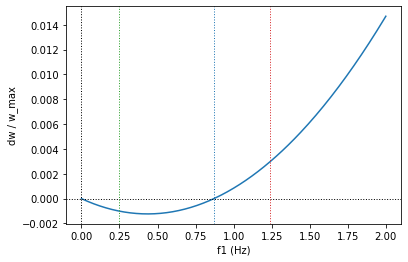

In [7]:
# Plot of the function
f1vals = np.linspace(0, 2*tau, 201)
fig, ax = plt.subplots()
ax.plot(f1vals * s_in_tau, dw(f1vals)/w_max)
ax.axhline(y=0, color='k', linestyle=':', linewidth=1)
ax.axvline(x=0, color='k', linestyle=':', linewidth=1)
ax.axvline(x=theta*s_in_tau, color='C0', linestyle=':', linewidth=1) # zero crossing
ax.axvline(x=f1_theo*s_in_tau, color='C2', linestyle=':', linewidth=1) # average value of f1
ax.axvline(x=w_max*s_in_tau, color='C3', linestyle=':', linewidth=1) # maximum evoked f1 

# weight change for a single presynaptic spike
plt.xlabel('f1 (Hz)')
plt.ylabel('dw / w_max');

## Helper functions

In [8]:
# functions for weight matrix normalization
def norm_rows(A):
    row_sums = A.sum(axis=1)
    return A/row_sums[:,np.newaxis]

def norm_rows_inplace(A):
    np.divide(A, A.sum(axis=1)[:,np.newaxis], out=A)
    return None

def norm_cols(A):
    col_sums = A.sum(axis=0)
    return A/col_sums

def norm_cols_inplace(A):
    np.divide(A, A.sum(axis=0), out=A)
    return None

# alternate column and row normalization several times
def norm_alternate(A, steps):
    for i in range(steps):
        norm_cols_inplace(A)
        norm_rows_inplace(A)
    return None

# alternate column and row normalization several times with cutoff at upper bound
def norm_alternate_wmax(A, steps, wmax):
    for i in range(steps):
        norm_cols_inplace(A)
        norm_rows_inplace(A)
        A[A>wmax] = wmax
    return None

# functions for inserting assemblies ("clusters") into a weight matrix
def insert_cluster(A, start, size, w):
    A[start:start+size,start:start+size] = w 

def amplify_cluster(A, start, size, f):
    A[start:start+size,start:start+size] *= f
    
def insert_eqclusters(A, nc, Nc, w):
    if nc > 0:
        for c in range(nc):
            insert_cluster(A, c*Nc, Nc, w)
    return None

# inverse function for sampling next evoked spike times from uniform random variables
def CDFm1(f1sum, x):
    return -np.log(1 + 1/f1sum*np.log(1 - x))

# Construct initial connectivity and matrices

Fraction of existing synapses: 0.6477106227106227


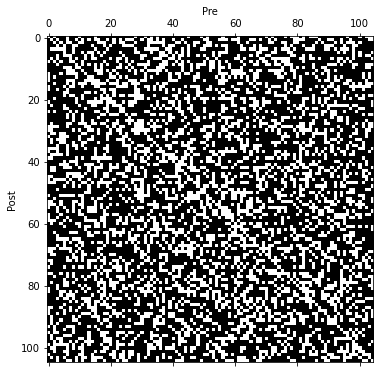

In [9]:
# random connectivity (adjacency) matrix with connection probability p_cc
Adja = rng.binomial(1, p_cc, size=(N,N))
np.fill_diagonal(Adja,0) # set diagonal entries to 0 as there are no self-connections

plt.figure(figsize=(6.5,6))
plt.matshow(Adja, 0, cmap='Greys')
plt.xlabel('Pre')
plt.ylabel('Post')
plt.gca().xaxis.set_label_position('top')

print("Fraction of existing synapses:", Adja.sum()/(N*(N-1)))

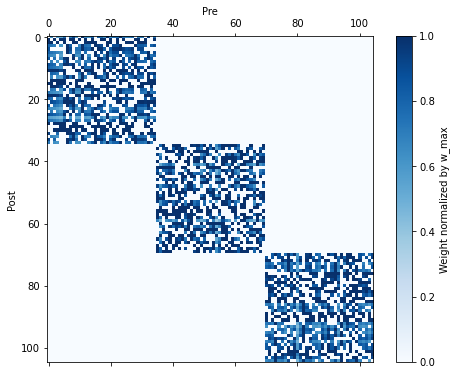

In [10]:
# initial weight matrix with assemblies
W = np.zeros((N,N))
Nc = int(np.round(N/nc))
# insert nc equal sized assemblies of size Nc
# remaining weights are zero
insert_eqclusters(W, nc, Nc, 1.0)

W = Adja * W

# perform column and row normalization for a couple of steps
norm_alternate_wmax(W, steps=10, wmax=w_max/W_max)
W *= W_max

plt.figure(figsize=(8,6))
plt.matshow(W/w_max, 0, cmap='Blues')
plt.xlabel('Pre')
plt.ylabel('Post')
plt.gca().xaxis.set_label_position('top')
plt.colorbar(label='Weight normalized by w_max')

# Simulation

## Simulation parameters

In [11]:
# total simulation time
tend_hours = 100 # in hours
tend = np.round(tend_hours * h_in_tau)

# synaptic spike-timing dependent plasticity starts after this equilibration time
tcut = np.round(100 * s_in_tau) # in seconds

# synaptic connectivity remodeling starts after this equilibration time for synaptic plasticity
tcut_adja = np.round(2 * h_in_tau) # in hours

# plotting interval: weights are plotted at multiples of this interval
# for longer simulation times these intervals could/should be increased
outputinterval = np.round(1 * h_in_tau) # in hours
# storage interval: weight and connectivity matrices are stored at multiples of this interval
outputinterval2 = np.round(5 * 60*s_in_tau) # in minutes

print("Number of plots:", int(np.round(tend/outputinterval)))
print("Number of stored weight matrices:", int(np.round(tend/outputinterval2)))

Number of plots: 100
Number of stored weight matrices: 1200


## Containers for storage and initialization

In [12]:
# lists for storage of matrices
tWlist = []
Wlist = []
Adjalist = []

# create numpy array as container for spike events
num_spikes_est = int(1.01 * tend * N * f_theo) # 1% larger than expected 
#spike_events = np.zeros((num_spikes_est,2))
print("Expected (+1%) number of spikes in simulation:", num_spikes_est)

Expected (+1%) number of spikes in simulation: 38178000


## Run simulation

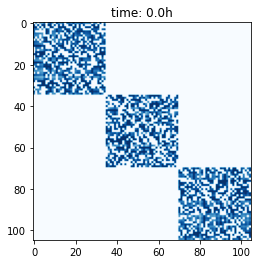

  1%|          | 359905.99792743544/36000000.0 [03:38<5:34:37, 1775.11it/s]

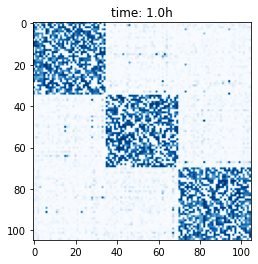

  2%|▏         | 719934.9898060559/36000000.0 [07:21<10:39:20, 919.69it/s] 

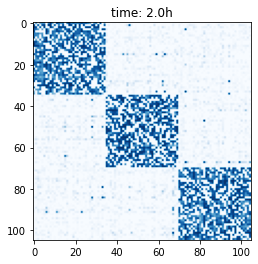

  3%|▎         | 1079859.2507806506/36000000.0 [11:21<5:33:09, 1746.92it/s]

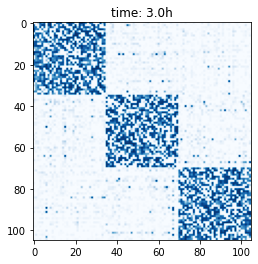

  4%|▍         | 1439865.9909884974/36000000.0 [15:13<6:57:51, 1378.46it/s]

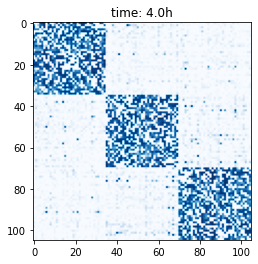

  5%|▍         | 1799866.3746484993/36000000.0 [20:21<6:58:22, 1362.41it/s]

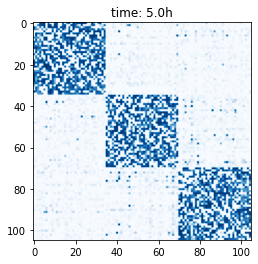

  6%|▌         | 2159899.931621239/36000000.0 [24:43<5:56:10, 1583.50it/s] 

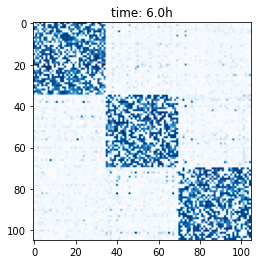

  7%|▋         | 2519960.593311505/36000000.0 [29:05<6:20:15, 1467.45it/s] 

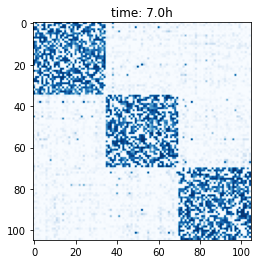

  8%|▊         | 2879870.5765207647/36000000.0 [33:28<6:30:29, 1413.61it/s]

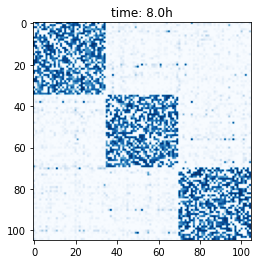

  9%|▉         | 3239972.5147916824/36000000.0 [37:48<5:36:15, 1623.76it/s]

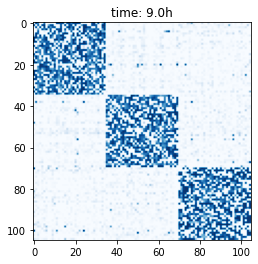

 10%|▉         | 3599971.452216792/36000000.0 [42:08<5:13:40, 1721.49it/s] 

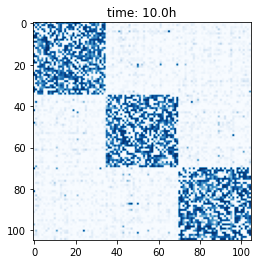

 11%|█         | 3959833.8170510055/36000000.0 [47:17<5:31:50, 1609.22it/s]

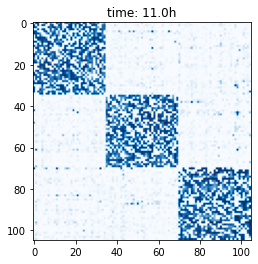

 12%|█▏        | 4319993.622852378/36000000.0 [51:35<7:11:58, 1222.28it/s] 

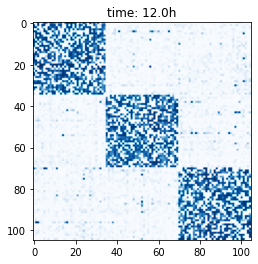

 13%|█▎        | 4679857.19845469/36000000.0 [56:35<5:44:26, 1515.49it/s]  

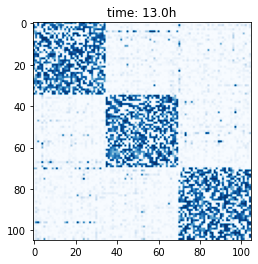

 14%|█▍        | 5039901.537406858/36000000.0 [1:00:33<5:24:56, 1587.95it/s] 

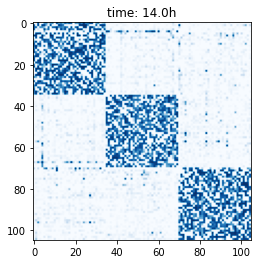

 15%|█▍        | 5399956.383395806/36000000.0 [1:04:08<6:16:06, 1356.01it/s] 

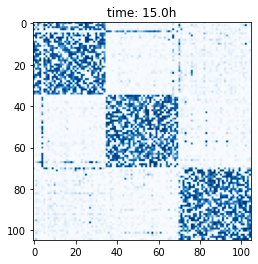

 16%|█▌        | 5759932.5100516/36000000.0 [1:08:32<5:30:35, 1524.51it/s]   

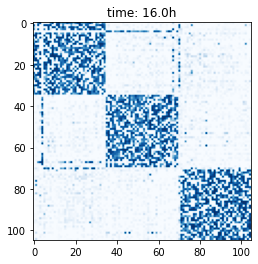

 17%|█▋        | 6119905.838317424/36000000.0 [1:12:53<4:48:08, 1728.33it/s] 

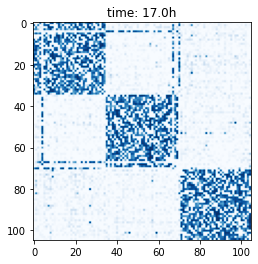

 18%|█▊        | 6479983.75610253/36000000.0 [1:16:52<5:04:59, 1613.19it/s]  

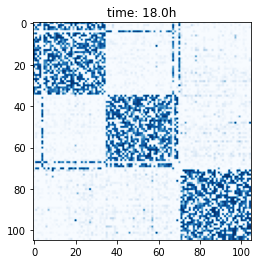

 19%|█▉        | 6839876.734853515/36000000.0 [1:20:50<5:11:08, 1561.96it/s] 

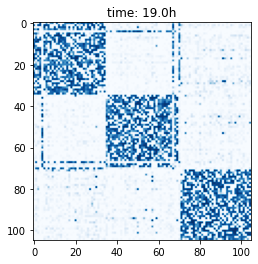

 20%|█▉        | 7199851.106255499/36000000.0 [1:24:47<5:04:26, 1576.63it/s] 

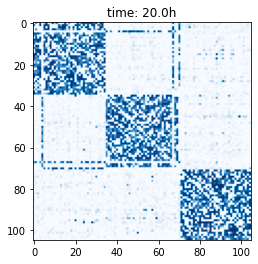

 21%|██        | 7559861.576440125/36000000.0 [1:28:42<5:09:54, 1529.49it/s] 

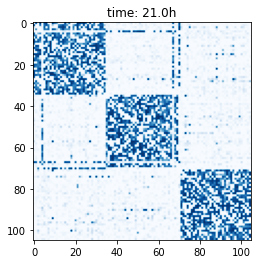

 22%|██▏       | 7919898.415276708/36000000.0 [1:32:39<5:24:39, 1441.55it/s] 

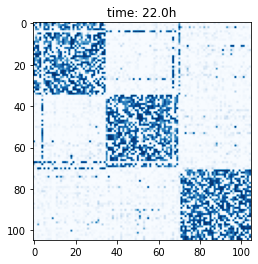

 23%|██▎       | 8279916.027965227/36000000.0 [1:36:36<4:42:39, 1634.52it/s] 

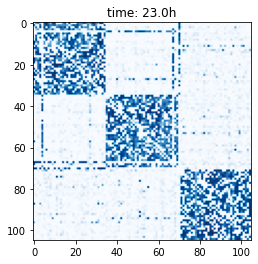

 24%|██▍       | 8639951.169372367/36000000.0 [1:40:32<4:37:10, 1645.13it/s] 

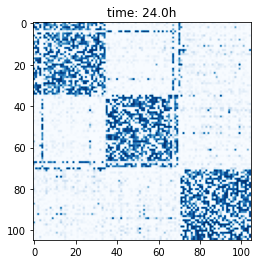

 25%|██▍       | 8999881.1400694/36000000.0 [1:44:21<4:10:41, 1795.07it/s]  

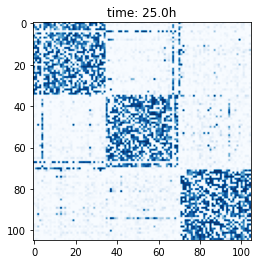

 26%|██▌       | 9359830.586204097/36000000.0 [1:47:52<4:14:21, 1745.62it/s]

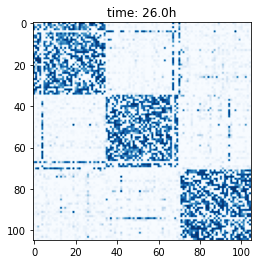

 27%|██▋       | 9719976.438715728/36000000.0 [1:51:57<4:39:46, 1565.55it/s]

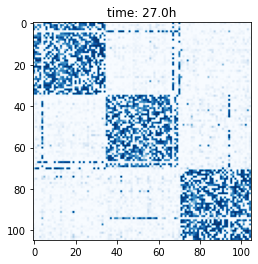

 28%|██▊       | 10079922.191203581/36000000.0 [1:55:54<4:25:13, 1628.83it/s]

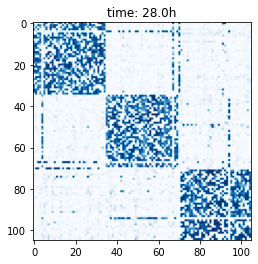

 29%|██▉       | 10439987.648432055/36000000.0 [1:59:51<4:49:48, 1469.96it/s]

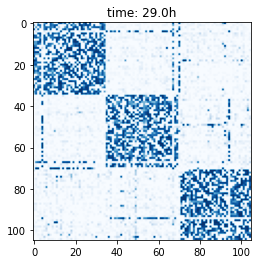

 30%|██▉       | 10799947.950489216/36000000.0 [2:03:49<4:39:13, 1504.14it/s]

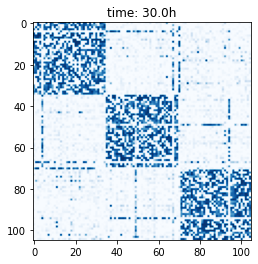

 31%|███       | 11159941.864807412/36000000.0 [2:07:48<4:33:16, 1514.99it/s]

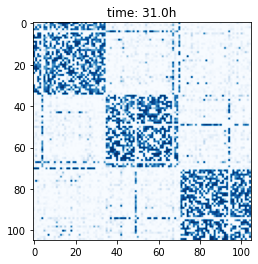

 32%|███▏      | 11519825.994353127/36000000.0 [2:11:48<4:40:24, 1455.03it/s]

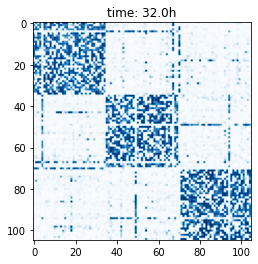

 33%|███▎      | 11879821.52996223/36000000.0 [2:15:40<3:54:47, 1712.18it/s] 

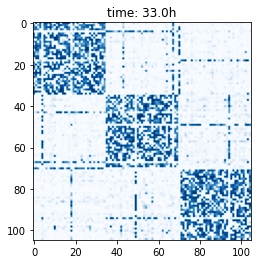

 34%|███▍      | 12239894.23829599/36000000.0 [2:19:48<4:10:08, 1583.11it/s] 

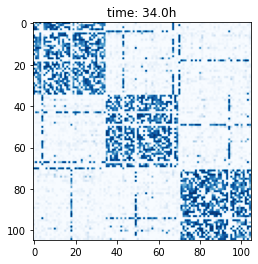

 35%|███▍      | 12599865.862715473/36000000.0 [2:23:21<3:52:54, 1674.50it/s]

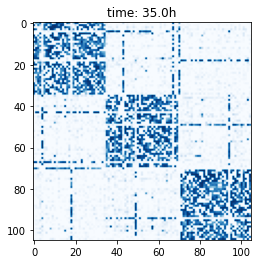

 36%|███▌      | 12959926.089172974/36000000.0 [2:27:09<3:34:26, 1790.68it/s]

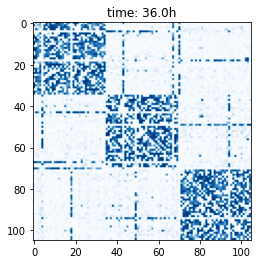

 37%|███▋      | 13319853.399094626/36000000.0 [2:30:40<3:42:41, 1697.43it/s]

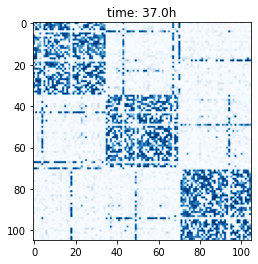

 38%|███▊      | 13679845.51080665/36000000.0 [2:34:08<3:27:27, 1793.16it/s] 

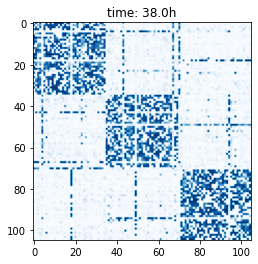

 39%|███▉      | 14039845.110445444/36000000.0 [2:37:36<3:29:11, 1749.63it/s]

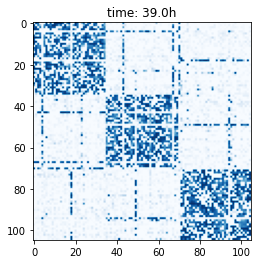

 40%|███▉      | 14399918.123276679/36000000.0 [2:41:49<3:56:27, 1522.49it/s]

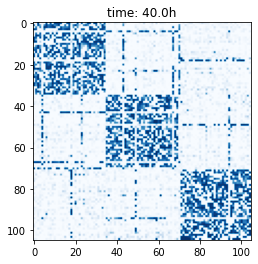

 41%|████      | 14759931.634324484/36000000.0 [2:45:23<3:42:43, 1589.37it/s]

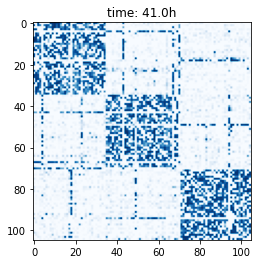

 42%|████▏     | 15119874.916442236/36000000.0 [2:48:58<3:15:31, 1779.81it/s]

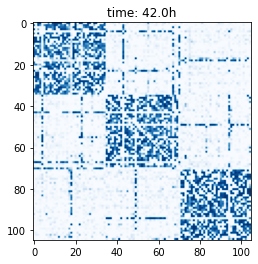

 43%|████▎     | 15479860.726415364/36000000.0 [2:52:30<3:18:22, 1724.07it/s]

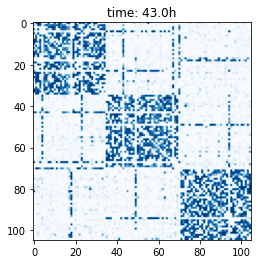

 44%|████▍     | 15839985.508586241/36000000.0 [2:56:03<3:03:14, 1833.70it/s]

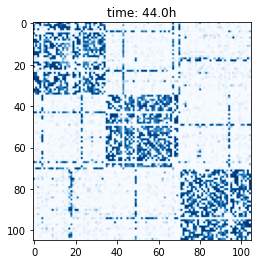

 45%|████▍     | 16199845.293372497/36000000.0 [2:59:41<3:07:59, 1755.46it/s]

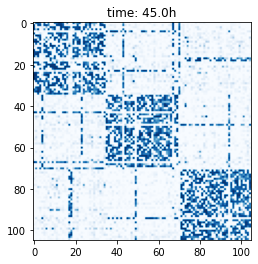

 46%|████▌     | 16559894.480312452/36000000.0 [3:03:13<3:08:07, 1722.28it/s]

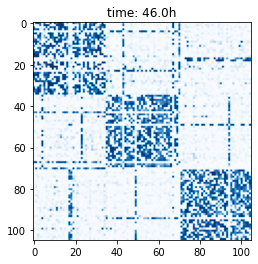

 47%|████▋     | 16919901.756584402/36000000.0 [3:06:55<3:11:59, 1656.26it/s]

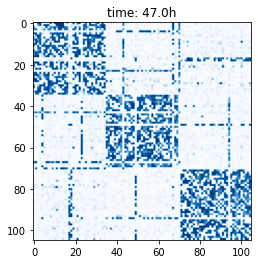

 48%|████▊     | 17279999.97003055/36000000.0 [3:10:27<3:01:10, 1722.16it/s] 

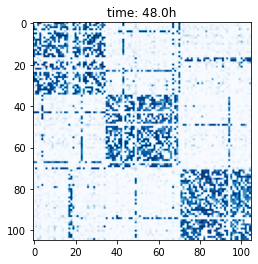

 49%|████▉     | 17639938.21017008/36000000.0 [3:13:59<3:03:25, 1668.32it/s] 

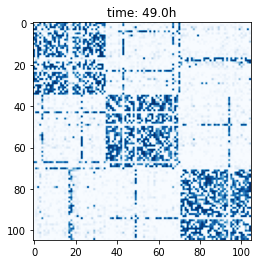

 50%|████▉     | 17999948.081450038/36000000.0 [3:17:33<3:12:45, 1556.31it/s]

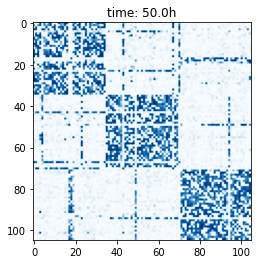

 51%|█████     | 18359972.191216797/36000000.0 [3:21:08<2:49:30, 1734.51it/s]

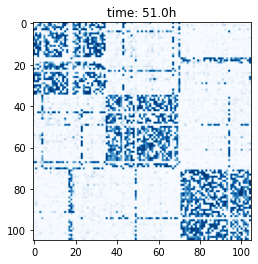

 52%|█████▏    | 18719875.82428648/36000000.0 [3:24:38<3:02:42, 1576.34it/s] 

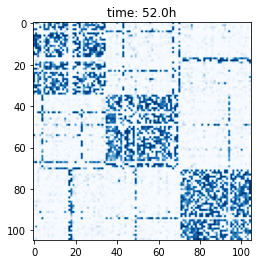

 53%|█████▎    | 19079895.469764896/36000000.0 [3:28:08<2:41:57, 1741.25it/s]

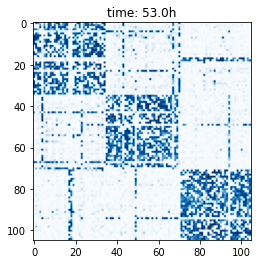

 54%|█████▍    | 19439975.02254031/36000000.0 [3:31:45<2:36:34, 1762.72it/s] 

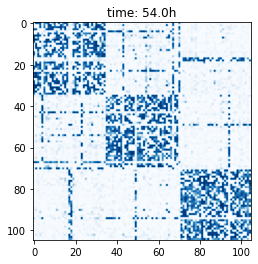

 55%|█████▍    | 19799828.604045764/36000000.0 [3:35:19<2:42:14, 1664.28it/s]

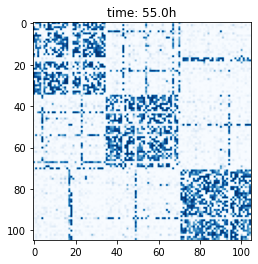

 56%|█████▌    | 20159892.359379042/36000000.0 [3:38:50<2:23:59, 1833.46it/s]

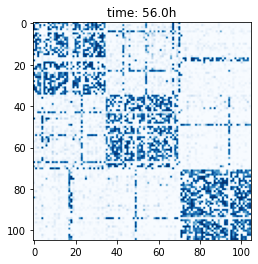

 57%|█████▋    | 20519985.973770782/36000000.0 [3:42:22<2:25:17, 1775.73it/s]

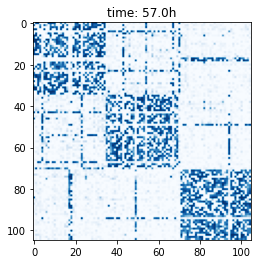

 58%|█████▊    | 20879929.330781348/36000000.0 [3:45:53<2:28:01, 1702.38it/s]

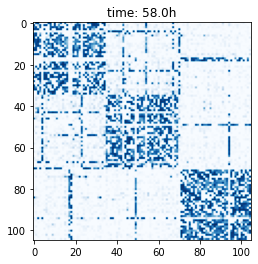

 59%|█████▉    | 21239820.139753055/36000000.0 [3:49:25<2:04:25, 1977.17it/s]

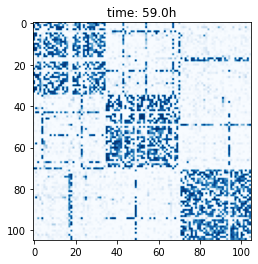

 60%|█████▉    | 21599971.455635652/36000000.0 [3:52:56<2:21:43, 1693.40it/s]

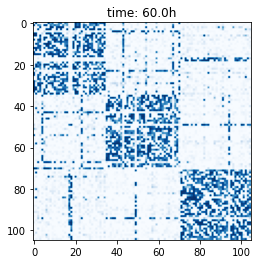

 61%|██████    | 21959869.01100021/36000000.0 [3:56:33<2:17:41, 1699.49it/s] 

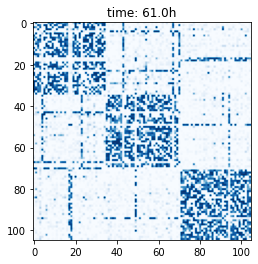

 62%|██████▏   | 22319973.607618198/36000000.0 [4:00:05<2:12:09, 1725.17it/s]

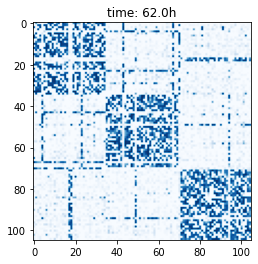

 63%|██████▎   | 22679929.14048325/36000000.0 [4:03:37<2:05:37, 1767.06it/s] 

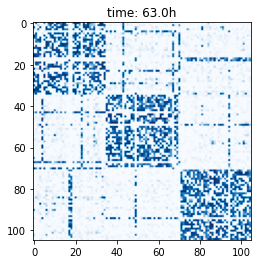

 64%|██████▍   | 23039896.688202526/36000000.0 [4:07:07<2:05:24, 1722.46it/s]

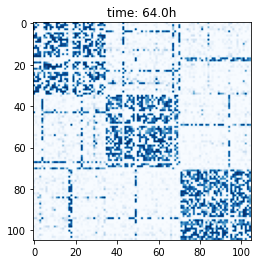

 65%|██████▍   | 23399845.044049017/36000000.0 [4:10:40<1:53:41, 1847.14it/s]

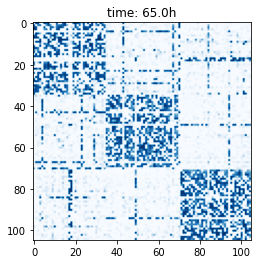

 66%|██████▌   | 23759906.092432756/36000000.0 [4:14:11<1:54:36, 1779.99it/s]

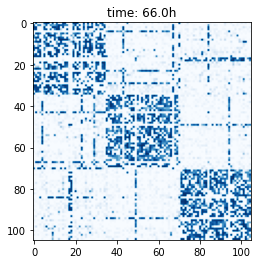

 67%|██████▋   | 24119893.400032762/36000000.0 [4:17:43<1:55:07, 1719.89it/s]

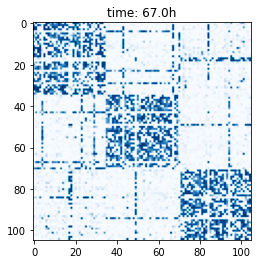

 68%|██████▊   | 24479851.11665962/36000000.0 [4:21:13<1:53:21, 1693.74it/s] 

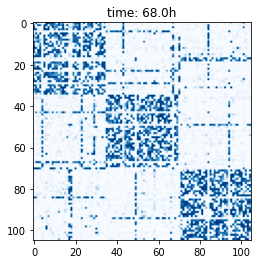

 69%|██████▉   | 24839824.40336645/36000000.0 [4:24:46<1:43:18, 1800.50it/s] 

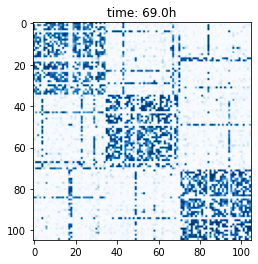

 70%|██████▉   | 25199912.142121647/36000000.0 [4:28:17<1:33:37, 1922.62it/s]

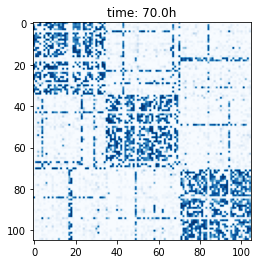

 71%|███████   | 25559953.194296792/36000000.0 [4:31:53<1:39:30, 1748.68it/s]

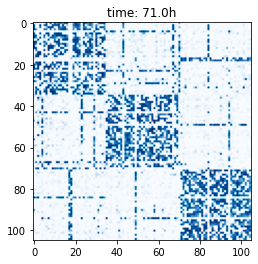

 72%|███████▏  | 25919880.637122504/36000000.0 [4:35:24<1:35:34, 1757.78it/s]

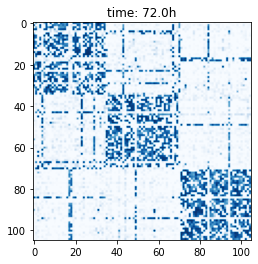

 73%|███████▎  | 26279835.370418128/36000000.0 [4:39:01<1:36:58, 1670.68it/s]

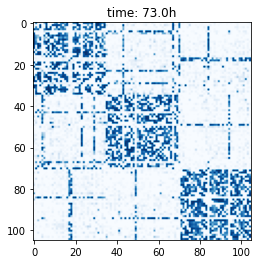

 74%|███████▍  | 26639893.702144764/36000000.0 [4:42:33<1:46:28, 1465.12it/s]

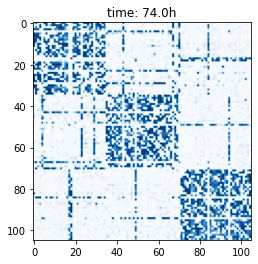

 75%|███████▍  | 26999888.846197918/36000000.0 [4:46:06<1:23:32, 1795.51it/s]

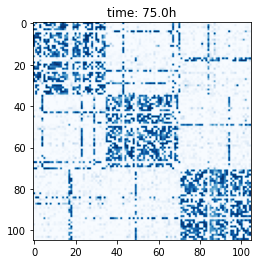

 76%|███████▌  | 27359974.979788847/36000000.0 [4:49:36<1:26:45, 1659.79it/s]

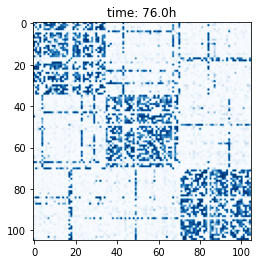

 77%|███████▋  | 27719866.33072615/36000000.0 [4:53:08<1:27:34, 1575.77it/s] 

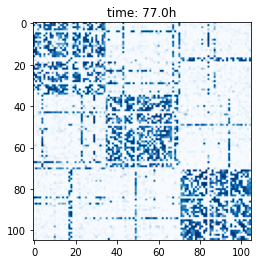

 78%|███████▊  | 28079945.154812444/36000000.0 [4:56:39<1:21:09, 1626.52it/s]

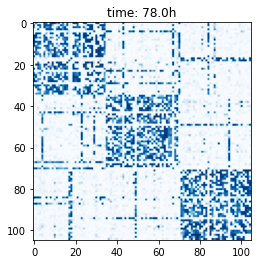

 79%|███████▉  | 28439832.84979345/36000000.0 [5:00:11<1:11:58, 1750.50it/s] 

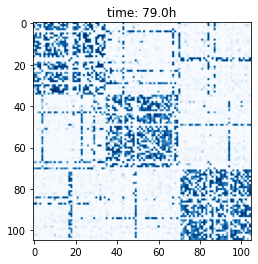

 80%|███████▉  | 28799830.30682553/36000000.0 [5:03:42<1:09:23, 1729.41it/s] 

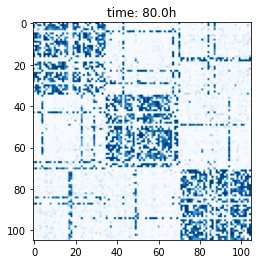

 81%|████████  | 29159908.60387233/36000000.0 [5:07:15<1:09:34, 1638.65it/s] 

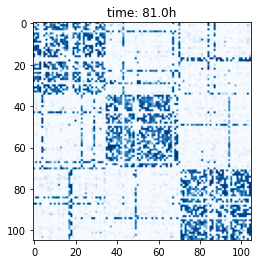

 82%|████████▏ | 29519882.57199586/36000000.0 [5:10:46<1:04:43, 1668.42it/s] 

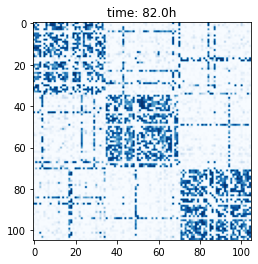

 83%|████████▎ | 29879891.75886958/36000000.0 [5:14:20<56:47, 1795.98it/s]   

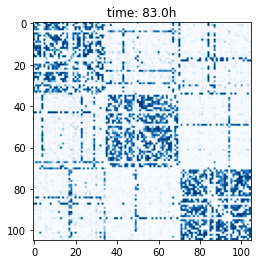

 84%|████████▍ | 30239853.40446109/36000000.0 [5:17:51<55:13, 1738.50it/s]   

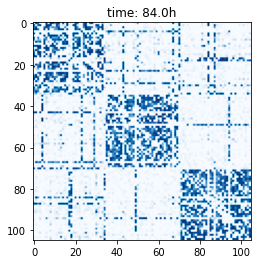

 85%|████████▍ | 30599946.700510357/36000000.0 [5:21:23<53:16, 1689.27it/s]  

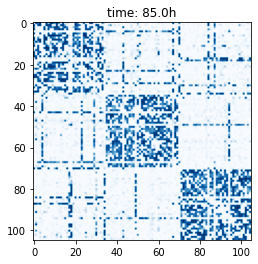

 86%|████████▌ | 30959821.173846487/36000000.0 [5:24:56<48:35, 1728.55it/s]  

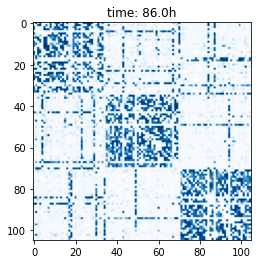

 87%|████████▋ | 31319969.173497897/36000000.0 [5:28:28<46:36, 1673.71it/s]  

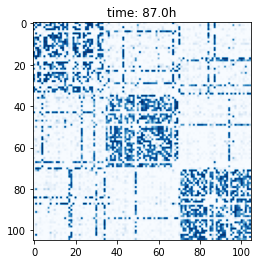

 88%|████████▊ | 31679863.80871202/36000000.0 [5:31:59<42:01, 1713.20it/s]   

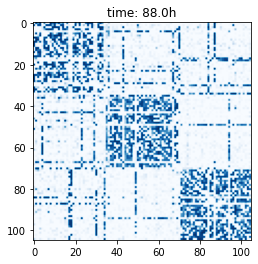

 89%|████████▉ | 32039840.684194144/36000000.0 [5:35:32<44:06, 1496.15it/s]  

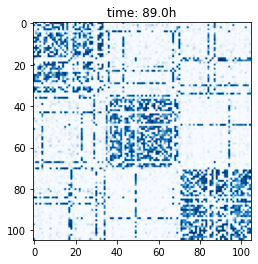

 90%|████████▉ | 32399990.586003356/36000000.0 [5:39:05<34:23, 1744.28it/s]  

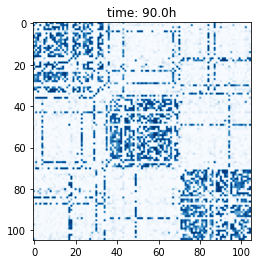

 91%|█████████ | 32759982.81375043/36000000.0 [5:42:37<37:54, 1424.23it/s]  

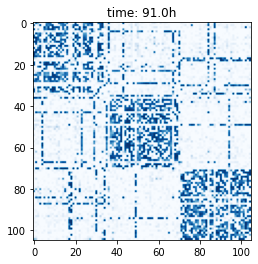

 92%|█████████▏| 33119882.465871755/36000000.0 [5:46:09<27:42, 1732.43it/s] 

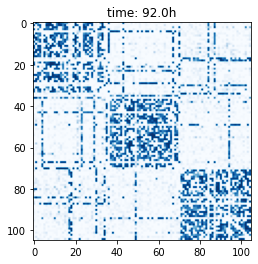

 93%|█████████▎| 33479936.83126039/36000000.0 [5:49:42<24:54, 1685.89it/s] 

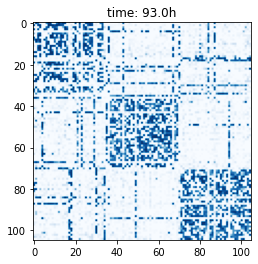

 94%|█████████▍| 33839818.784516655/36000000.0 [5:53:14<19:57, 1804.18it/s]

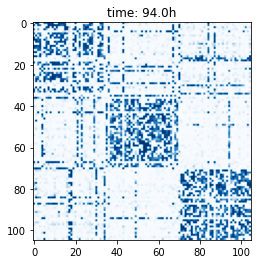

 95%|█████████▍| 34199995.97470162/36000000.0 [5:56:46<20:04, 1494.73it/s] 

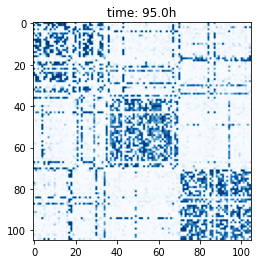

 96%|█████████▌| 34559933.76680716/36000000.0 [6:00:19<13:47, 1740.50it/s] 

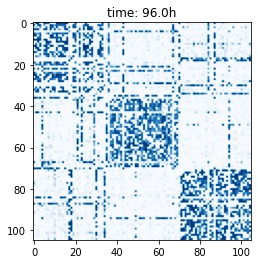

 97%|█████████▋| 34919925.68059317/36000000.0 [6:03:53<10:24, 1729.43it/s] 

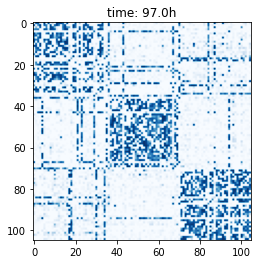

 98%|█████████▊| 35279925.250158735/36000000.0 [6:07:27<06:56, 1727.18it/s]

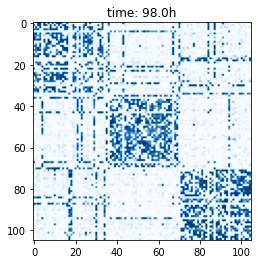

 99%|█████████▉| 35639923.47160236/36000000.0 [6:11:00<03:44, 1600.41it/s] 

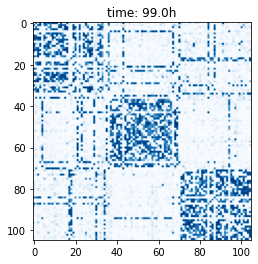

100%|█████████▉| 35999930.02812584/36000000.0 [6:14:33<00:00, 1718.63it/s] 

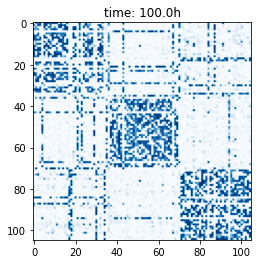

36000101.889375865it [6:14:34, 1601.84it/s]                               

Final time: 360000.0062640128
Total number of spikes: 37797641
Average rate per neuron: 0.9999375925925926 Hz


In [13]:
# initialization of simulation variables
t = 0.0 # time (in tau)
f1 = np.zeros(N) # initial values for evoked intensities f1
s = 0 # spike counter

adjadilcounter = 0 # counter for synaptic remodeling
# helper variables (times) for plotting and storing matrices
tmodold = 0.0
tmodold2 = 0.0

# plot initial weight matrix as reference
plt.imshow(W/w_max, cmap="Blues", vmin=0, vmax=1)
plt.title('time: ' + str(np.round(t/h_in_tau,2)) + 'h')
plt.show()

# store initial matrices as reference
Wlist.append(W.copy())
Adjalist.append(Adja.copy())
tWlist.append(t)

pbar = tqdm(total = tend)
while t < tend:
    # Step 1: determine next spike time and spiking neuron
    dt0 = rng.exponential(scale_f0sum) # generate time until next spontaneous spike
    # generate time dt1 until next evoked spike:
    f1sum = f1.sum()
    xunif = rng.random()
    if xunif >= 1 - np.exp(-f1sum): 
        dt1 = dt0 + 1 # dt1 is actually infinity
    else: 
        dt1 = CDFm1(f1sum, xunif) # dt1 is finite
    # determine if next spike is spontaneous or evoked and select spiking neuron accordingly:
    if dt0 < dt1: # spontaneous spike comes first                       
        dt = dt0 # set next spike time
        spikingneuron = rng.choice(N,1,p=f0prob)[0] # distribute it among neurons according to their spont. rates
    else: # evoked spike comes first
        dt = dt1
        f1prob = f1/f1sum
        spikingneuron = rng.choice(N,1,p=f1prob)[0] # distribute it among neurons according to their evoked rates
    t += dt # update time to the spike
    pbar.update(dt) # update time bar
    
    # Step 2: evolve and update evoked intensities
    f1evo = f1*np.exp(-dt) # time evolution until the spike
    f1 = f1evo + W[:,spikingneuron] # update intensities using the old weights (before plasticity)

    # Step 3: spike-timing dependent synaptic plasticity
    if t > tcut: # after equilibration time
        # update of weights from spiking neuron:
        W[:,spikingneuron] += Adja[:,spikingneuron]*dw(f1evo)
        # update of weights to spiking neuron:
        W[spikingneuron,:] += Adja[spikingneuron,:]*dw(f1evo)
        # bounds and normalization of weights
        W[W<0.0] = 0.0
        W = norm_cols(W)
        W = W_max * norm_rows(W)
        W[W>w_max] = w_max

    # Step 4: synaptic connectivity remodeling
    # in a Monte-Carlo fashion: after every adjadil spike
    # a possible synaptic connection couple is chosen randomly
    # and is kept or created with the connection probability p_cc
    # otherwise it is deleted or remains absent
    # the frequency of updates given by adjadil (since the total spike rate remains constant)
    # together with p_cc determines the lifetime of the synaptic connections
    if (t > tcut_adja): # after equilibration time
        adjadilcounter += 1 # update counter
        if (adjadilcounter >= adjadil):
            coupl = rng.choice(range(N),2,replace=False)
            p = p_cc
            if rng.random() < p: # keep or create synaptic connection
                Adja[coupl[0],coupl[1]] = 1 # set adjacency matrix entry to one                       
            else: # delete synaptic connection (if present)
                Adja[coupl[0],coupl[1]] = 0 # set (keep) adjacency matrix entry to zero
                W[coupl[0],coupl[1]] = 0.0 # set (keep) synaptic weight zero
            adjadilcounter = 0 # reset counter
    
    # Step 5: recordings of spiking activity
    #spike_events[s,:] = np.array([t,spikingneuron])
    s += 1 # spike counter
    
    # Step 6: plotting of the weight matrix
    tmodnew = t % outputinterval
    if tmodnew < tmodold:
        plt.imshow(W/w_max, cmap="Blues", vmin=0, vmax=1)
        plt.title('time: ' + str(np.round(t/h_in_tau,2)) + 'h')
        plt.show()
    tmodold = tmodnew
    
    # Step 7: storing weight and connectivty matrices
    tmodnew2 = t % outputinterval2
    if tmodnew2 < tmodold2:
        tWlist.append(t)
        Wlist.append(W.copy()) # Wlist.append(W.astype('float32')) # for smaller storage requirements
        Adjalist.append(Adja.copy()) # Adjalist.append(Adja.astype('uint8'))
    tmodold2 = tmodnew2
# end of while loop
    
pbar.update(dt+100)
pbar.close()
print("Final time:", t/s_in_tau)
print("Total number of spikes:", s)
print("Average rate per neuron:", s/tend/N * s_in_tau, "Hz")

## Save simulation results

In [14]:
# convert to numpy arrays
tWs = np.array(tWlist)
Ws = np.array(Wlist) #np.array(Wlist, dtype='float32')
As = np.array(Adjalist) #np.array(Adjalist, dtype='uint8')

# file name for saving
file = "poisson_drifting_weights_seed" + str(seed)
file += "_tend" + str(tend_hours) + "h"

np.savez(file, tWs=tWs, Ws=Ws, As = As, tend=tend, tlast=t)

In [15]:
# save spiking activity
# file_spikes = "poisson_drifting_spikes_seed" + str(seed)
# file_spikes += "_tend" + str(tend_hours) + "h"

# # s equals total number of spikes
# np.savez(file_spikes, spike_events = spike_events[:s,:], num_spikes = s)

# Analyze assembly structure

In [16]:
# requires brain connectivity toolbox bctpy for Louvain clustering algorithm
import bct

## Helper functions for clustering

In [17]:
# helper functions
def cluster(W, L0=None, gamma=1):
    #L0 - initial community affiliation
    
    (L, q) = bct.community_louvain(W.copy(), gamma, L0)
    
    num_clusters, clusters, sizes = get_clusters(L)
    sorted_ind = np.concatenate(clusters) # index of neurons sorted by clusters
    return L, sorted_ind, num_clusters, clusters, sizes

def get_clusters(L):
    num_clusters = L.max()
    clusters = [] # arrays of neuron indexes belonging to different clusters
    for i in range(num_clusters):
        clusters.append(np.where(L==i+1)[0]) 
    sizes = [len(c) for c in clusters]
    return num_clusters, clusters, sizes

def community(W, L0=None, gamma=1):
    (L, q) = bct.community_louvain(W.copy(), gamma, L0)
    return L

def get_sorted_ind(L):
    sorted_ind = np.concatenate([np.where(L==i+1)[0] for i in range(L.max())])
    return sorted_ind

## Plot sorted weight matrix

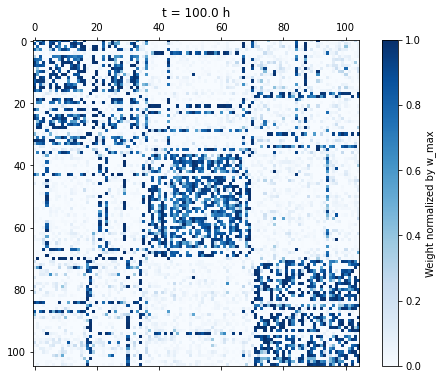

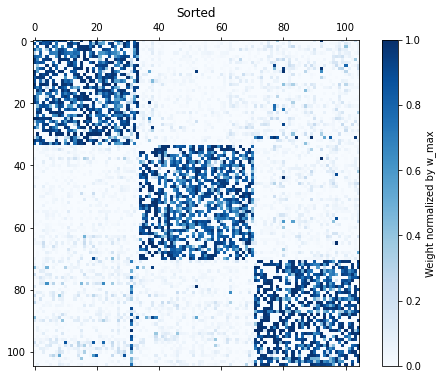

In [18]:
#ind_plot = -1 # consider last stored weight matrix
tplot_hours = 100.0
ind_plot = np.searchsorted(np.floor(tWs/h_in_tau), tplot_hours)

W = Ws[ind_plot].copy()

# detect assembly (community) structure in the weight matrix using Louvain clustering algorithm
L, sorted_ind, _, _, cluster_sizes = cluster(W, L0=None)

# sorted weight matrix
W_= W[:, sorted_ind]
W_ = W_[sorted_ind,:]

plt.figure(figsize=(8,6))
plt.matshow(W/w_max, 0, cmap='Blues')
plt.title('t = ' + str(np.round(tWs[ind_plot]/h_in_tau,3)) + ' h')
plt.colorbar(label='Weight normalized by w_max')

plt.figure(figsize=(8,6))
plt.matshow(W_/w_max, 0, cmap='Blues')
plt.title("Sorted");
plt.colorbar(label='Weight normalized by w_max')